# Exploratory data analysis

Data from https://www.kaggle.com/datasets/valakhorasani/gym-members-exercise-dataset

## Setup

In [13]:
%%capture
!pip install -r ../requirements.txt --force-reinstall

In [2]:
import os
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import OrdinalEncoder
import tqdm # DO NOT REMOVE

%matplotlib inline

In [3]:
PROJECT_PATH = Path.joinpath(Path.cwd(), '..')
DATA_PATH = PROJECT_PATH / "data"
CSV_PATH = DATA_PATH / "gym_members_exercise_tracking.csv"

In [4]:
df = pd.read_csv(CSV_PATH)

---

In [7]:
%%capture
!pip install auto-sklearn

In [9]:
# Define the target variable
target_column = 'Calories_Burned'

# Extract features (X) and target (y)
X = df.drop(columns=[target_column])
y = df[target_column]

In [17]:
import autosklearn.classification
import sklearn.model_selection
import sklearn.datasets
import sklearn.metrics

X_train, X_test, y_train, y_test = \
    sklearn.model_selection.train_test_split(X, y, random_state=1)
automl = autosklearn.classification.AutoSklearnClassifier()
automl.fit(X_train, y_train)
y_hat = automl.predict(X_test)
print("Accuracy score", sklearn.metrics.accuracy_score(y_test, y_hat))

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

---

## Automatic EDA

We have used a tool for automatically generate a report for the dataset. There we have the necessary data for doing the univariate, bivariate and correlation analysis.

For the **univariate analysis** we have quantile statistics (min, 5th percentile, Q1, median, Q3, 95th percentile, max, range, IQR), descriptive statistics (standard deviation, CV, kurtosis, mean, MAD, skewness, sum, variance, monotonicity) and a plot (histogram, bar chart) for each feature.

For the **bivariate analysis** we have a scatter plot for each pair of features.

For the **correlation analysis** we have a correlation matrix and a heatmap.

Moreover, general information about the dataset is provided, such as the number of missing values, unique values, duplicated rows, numerical and categorical features, etc.

Last but not least, there are alerts for high correlated features and other issues that needs to be addressed. The alerts aren't perfect but they are a good starting point.

In [5]:
from ydata_profiling import ProfileReport

PROFILE_PATH = DATA_PATH / "profiling_report.pp"

if not PROFILE_PATH.exists():
    print("Generating profiling report...")
    profile = ProfileReport(df, title="Profiling Report")
    profile.dump(PROFILE_PATH)
    profile.to_file("profiling_report.html")

In [6]:
import webbrowser

absolute_path = Path.cwd() / "profiling_report.html"
webbrowser.open(absolute_path.as_uri())
print(absolute_path.as_uri())

file:///mnt/40EE82D1EE82BF22/Users/jordi/Documents/GitHub/meinf-ai-wp-01/notebooks/profiling_report.html


## Data overview

We have 973 observations and 15 features, which is a healthy ratio for most machine learning models. Anyway, removing some correlated features could be beneficial.

In [7]:
df.shape

(973, 15)

The data types are not optimal. The `Gender`, `Workout_Type`, `Experience_Level` and `Workout_Frequency (days/week)` columns should be categorical.

The numerical types could be downcasted but we are not going to do it because we will normalize them later on.

In [8]:
df.dtypes

Age                                int64
Gender                            object
Weight (kg)                      float64
Height (m)                       float64
Max_BPM                            int64
Avg_BPM                            int64
Resting_BPM                        int64
Session_Duration (hours)         float64
Calories_Burned                  float64
Workout_Type                      object
Fat_Percentage                   float64
Water_Intake (liters)            float64
Workout_Frequency (days/week)      int64
Experience_Level                   int64
BMI                              float64
dtype: object

Correcting the data types will help us to save memory and make the code more readable.

In [9]:
df_casted = df.astype(copy=True, dtype={
    'Workout_Frequency (days/week)': 'category',
    'Experience_Level': 'category',
    'Workout_Type': 'category',
    'Gender': 'category'
})
df_casted.dtypes

Age                                 int64
Gender                           category
Weight (kg)                       float64
Height (m)                        float64
Max_BPM                             int64
Avg_BPM                             int64
Resting_BPM                         int64
Session_Duration (hours)          float64
Calories_Burned                   float64
Workout_Type                     category
Fat_Percentage                    float64
Water_Intake (liters)             float64
Workout_Frequency (days/week)    category
Experience_Level                 category
BMI                               float64
dtype: object

The domain of the different features (numerical and categorical) seems to be reasonable.

In [10]:
df_casted.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,973.0,38.683453,12.180928,18.00,28.00,40.00,49.00,59.00
Weight (kg),973.0,73.854676,21.207500,40.00,58.10,70.00,86.00,129.90
Height (m),973.0,1.722580,0.127720,1.50,1.62,1.71,1.80,2.00
Max_BPM,973.0,179.883864,11.525686,160.00,170.00,180.00,190.00,199.00
Avg_BPM,973.0,143.766701,14.345101,120.00,131.00,143.00,156.00,169.00
Resting_BPM,973.0,62.223022,7.327060,50.00,56.00,62.00,68.00,74.00
Session_Duration (hours),973.0,1.256423,0.343033,0.50,1.04,1.26,1.46,2.00
Calories_Burned,973.0,905.422405,272.641516,303.00,720.00,893.00,1076.00,1783.00
Fat_Percentage,973.0,24.976773,6.259419,10.00,21.30,26.20,29.30,35.00
Water_Intake (liters),973.0,2.626619,0.600172,1.50,2.20,2.60,3.10,3.70


In [11]:
categorical_df = df_casted.select_dtypes(include=['category'])
categories_values = {col: sorted(df_casted[col].value_counts().index.to_list()) for col in categorical_df.columns}
for col, values in categories_values.items():
    print(f"{col}: {values}")

Gender: ['Female', 'Male']
Workout_Type: ['Cardio', 'HIIT', 'Strength', 'Yoga']
Workout_Frequency (days/week): [2, 3, 4, 5]
Experience_Level: [1, 2, 3]


There are no duplicated rows.

In [12]:
df.duplicated().sum()

np.int64(0)

There are no missing values.

In [13]:
df.isnull().sum()

Age                              0
Gender                           0
Weight (kg)                      0
Height (m)                       0
Max_BPM                          0
Avg_BPM                          0
Resting_BPM                      0
Session_Duration (hours)         0
Calories_Burned                  0
Workout_Type                     0
Fat_Percentage                   0
Water_Intake (liters)            0
Workout_Frequency (days/week)    0
Experience_Level                 0
BMI                              0
dtype: int64

## Univariate analysis

### Kurtosis and skewness

The features `Weight (kg)`, `Height (cm)`, `Session_Duration (minutes)`, `Calories_Burned`, `Fat_Percentage`, `Water_Intake (liters)` and `BMI` follow a gaussian-like distribution with light tails (low kurtosis).


The `Weight (kg)` feature is the most (right) skewed of all, but there are no outliers, so we are not going to reduce the skewness.

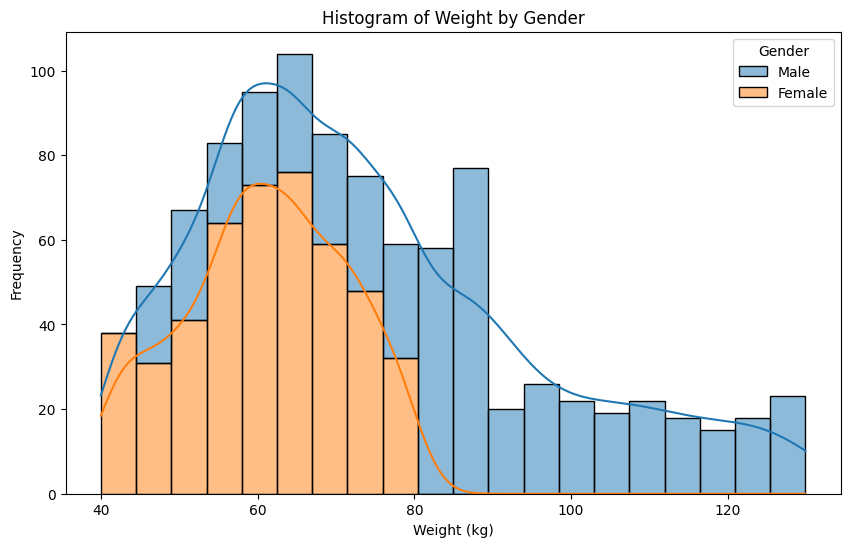

In [14]:
# Hitogram of Weight by Gender
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="Weight (kg)", bins=20, hue="Gender", multiple="stack", kde=True)
plt.title("Histogram of Weight by Gender")
plt.xlabel("Weight (kg)")
plt.ylabel("Frequency")
plt.show()

In [15]:
# Skewness and kurtosis for all numerical columns
columns_to_analyze = df.select_dtypes(include=np.number).columns

analysis_results = []

for column in columns_to_analyze:
    skewness = df[column].skew()
    kurtosis = df[column].kurtosis()
    analysis_results.append({"Column": column, "Skewness": skewness, "Kurtosis": kurtosis})

analysis_df = pd.DataFrame(analysis_results).sort_values(by="Skewness", ascending=False).reset_index(drop=True)

analysis_df.set_index('Column', inplace=True)

analysis_df

,Skewness,Kurtosis
Column,,
Weight (kg),0.772384,-0.023969
BMI,0.763648,0.743240
Height (m),0.338858,-0.723633
Experience_Level,0.318513,-1.123111
Calories_Burned,0.278321,-0.056050
Workout_Frequency (days/week),0.149815,-0.806101
Avg_BPM,0.086361,-1.198724
Water_Intake (liters),0.071480,-1.020298
Session_Duration (hours),0.025761,-0.350805


### Common values

`Water_Intake (liters)` has two peaks on 2.7 and 3.5 liters, which is strange. We will keep an eye on this feature.

In [16]:
# Common `Water_Intake (liters)` values
water_intake_counts = df['Water_Intake (liters)'].value_counts()
water_intake_percentage = (water_intake_counts / len(df)) * 100

pd.DataFrame({
    'Count': water_intake_counts,
    'Percentage': water_intake_percentage
}).head()

,Count,Percentage
Water_Intake (liters),,
3.5,124,12.744090
2.7,123,12.641316
2.3,59,6.063720
2.1,57,5.858171
2.4,55,5.652621


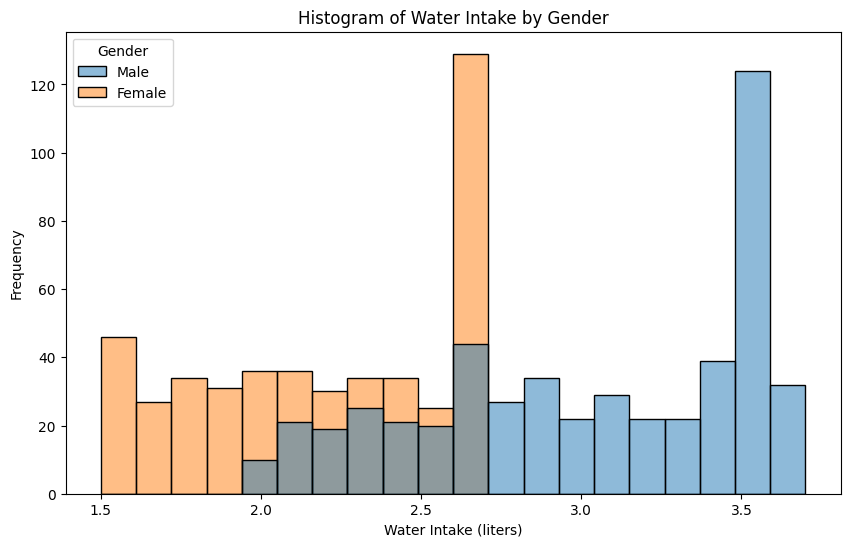

In [38]:
# Histogram of Water Intake by Gender
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="Water_Intake (liters)", bins=20, hue="Gender")
plt.title("Histogram of Water Intake by Gender")
plt.xlabel("Water Intake (liters)")
plt.ylabel("Frequency")
plt.show()

There are two gaps on `Fat_Percentage`, one between 21-24% for women and another between 10-16% for men. It doesn't make sense to have a gap with the number of samples we have, so something is wrong with the data.

References:
-  [A Study on Body Fat Percentage for Physical Fitness and Prevention of Obesity: A Two Compartment Model](https://mpra.ub.uni-muenchen.de/117158/1/Body%20Fat%20Per-27-4-23%20MPRA.pdf)

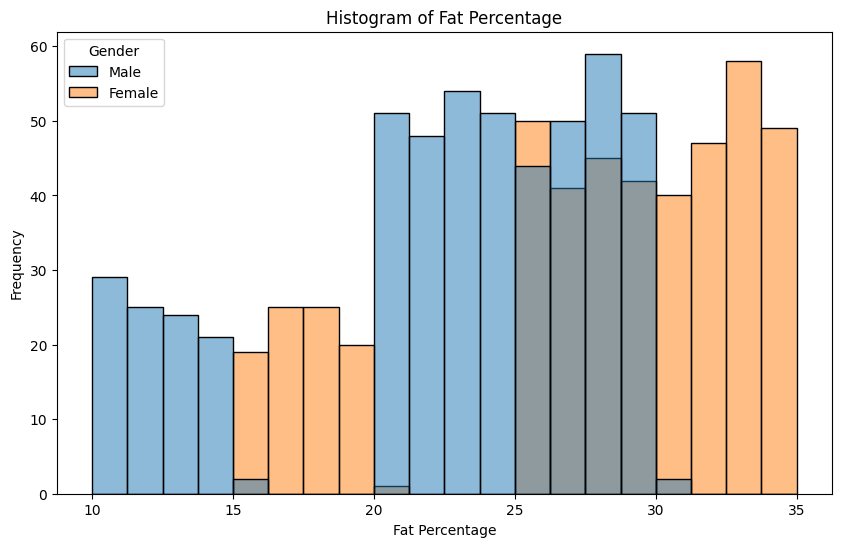

In [37]:
#  Histogram of Fat Percentage
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="Fat_Percentage", bins=20, hue="Gender")
plt.title("Histogram of Fat Percentage")
plt.xlabel("Fat Percentage")
plt.ylabel("Frequency")
plt.show()

> **Spoiler**: When we perform the bivariate analysis between the `Water_Intake (liters)` and `Fat_Percentage` features, we will definitely observe the outliers.

### Outliers

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Gender", y="Water_Intake (liters)")
plt.title("Box Plot of Water Intake by Gender")
plt.xlabel("Gender")
plt.ylabel("Water Intake (liters)")
plt.show()

In [16]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Gender", y="Fat_Percentage")
plt.title("Box Plot of Fat Percentage by Gender")
plt.xlabel("Gender")
plt.ylabel("Fat Percentage")
plt.show()

ModuleNotFoundError: No module named 'pandas.core.methods.to_dict'

<Figure size 1000x600 with 0 Axes>

In [52]:
from scipy.stats import zscore

# Calculate z-scores for all numerical columns
z_scores = df.select_dtypes(include=np.number).apply(zscore)

# Find rows where any z-score is greater than 3 (outliers)
df[(z_scores.abs() > 3).any(axis=1)]

,Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
133,21,Male,125.2,1.66,196,159,60,1.38,1207.0,HIIT,29.8,3.4,3,2,45.43
251,33,Male,117.0,1.61,166,130,55,1.04,744.0,HIIT,25.1,2.4,3,2,45.14
261,57,Male,126.8,1.63,161,133,73,0.96,632.0,Yoga,20.8,2.1,2,1,47.72
291,55,Male,128.4,1.68,178,165,52,1.13,923.0,Cardio,20.4,2.6,4,2,45.49
470,34,Male,124.6,1.63,161,136,66,1.41,1055.0,HIIT,27.6,2.8,3,2,46.90
511,39,Male,86.2,1.82,191,160,72,1.96,1725.0,Strength,10.2,3.5,5,3,26.02
687,18,Male,125.9,1.67,172,153,60,1.46,1229.0,Yoga,20.6,2.2,3,2,45.14
710,38,Male,123.3,1.62,161,165,65,1.34,1216.0,Yoga,21.2,2.3,4,2,46.98
712,19,Male,82.4,1.96,174,169,62,1.90,1766.0,HIIT,10.1,3.5,5,3,21.45
854,48,Male,129.2,1.61,193,167,62,1.06,876.0,Yoga,21.4,2.9,4,2,49.84


In [57]:
df_numerical = df.select_dtypes(include=np.number)

# Calculate Q1 (25th percentile) and Q3 (75th percentile) for each numerical column
Q1 = df_numerical.quantile(0.25)
Q3 = df_numerical.quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Determine outliers using the IQR score
df_numerical[((df_numerical < (Q1 - 1.5 * IQR)) | (df_numerical > (Q3 + 1.5 * IQR))).any(axis=1)]

,Age,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
10,41,120.8,1.67,188,146,54,0.82,593.0,20.5,3.0,2,1,43.31
12,57,112.5,1.61,195,165,61,1.24,1013.0,22.1,2.7,3,2,43.40
35,26,127.6,1.73,167,160,62,1.32,1162.0,27.3,2.9,3,1,42.63
55,23,114.8,1.60,182,163,60,1.47,1318.0,21.7,2.7,4,2,44.84
90,25,81.5,1.61,170,159,63,1.93,1688.0,10.9,3.5,4,3,31.44
96,56,129.0,1.78,194,126,64,1.29,805.0,27.1,2.7,2,1,40.71
99,24,60.1,1.79,170,165,63,1.97,1625.0,15.9,2.7,4,3,18.76
122,56,129.5,1.95,160,129,66,1.00,639.0,25.2,3.5,2,1,34.06
124,26,86.2,1.68,189,157,72,1.97,1701.0,13.3,3.5,5,3,30.54
133,21,125.2,1.66,196,159,60,1.38,1207.0,29.8,3.4,3,2,45.43


## Correlation analysis

### Pearson correlation heatmap

In [ ]:
encoder = OrdinalEncoder()
encoded_df = pd.DataFrame(encoder.fit_transform(df), columns=df.columns)

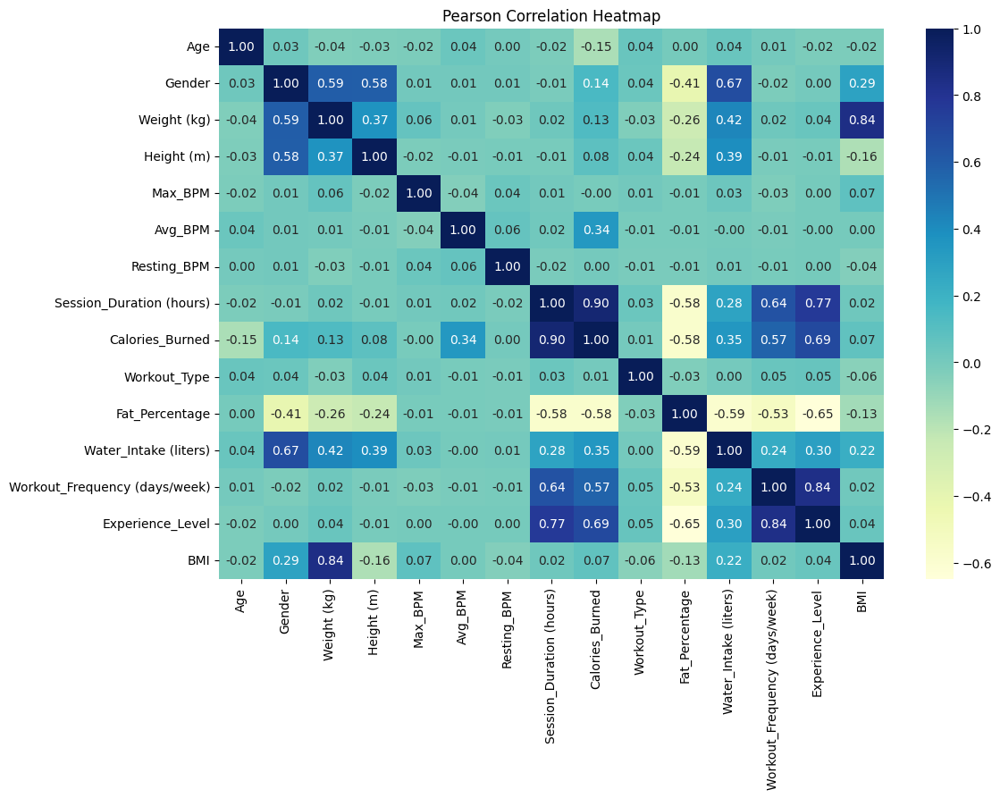

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(encoded_df.corr(method="pearson"), cmap="YlGnBu", annot=True, fmt=".2f")

plt.title("Pearson Correlation Heatmap")
plt.show()

### Spearman correlation heatmap

In [ ]:
encoder = OrdinalEncoder()
encoded_df = pd.DataFrame(encoder.fit_transform(df), columns=df.columns)

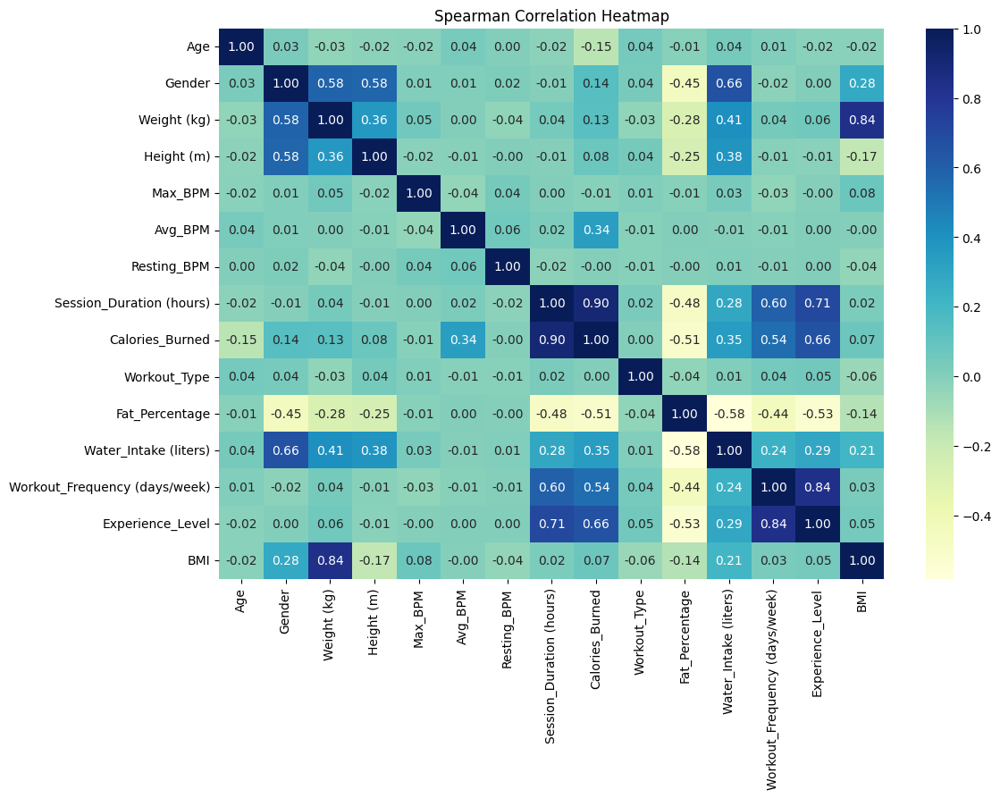

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(encoded_df.corr(method="spearman"), cmap="YlGnBu", annot=True, fmt=".2f")

plt.title("Spearman Correlation Heatmap")
plt.show()

### Pairwise relationships plot

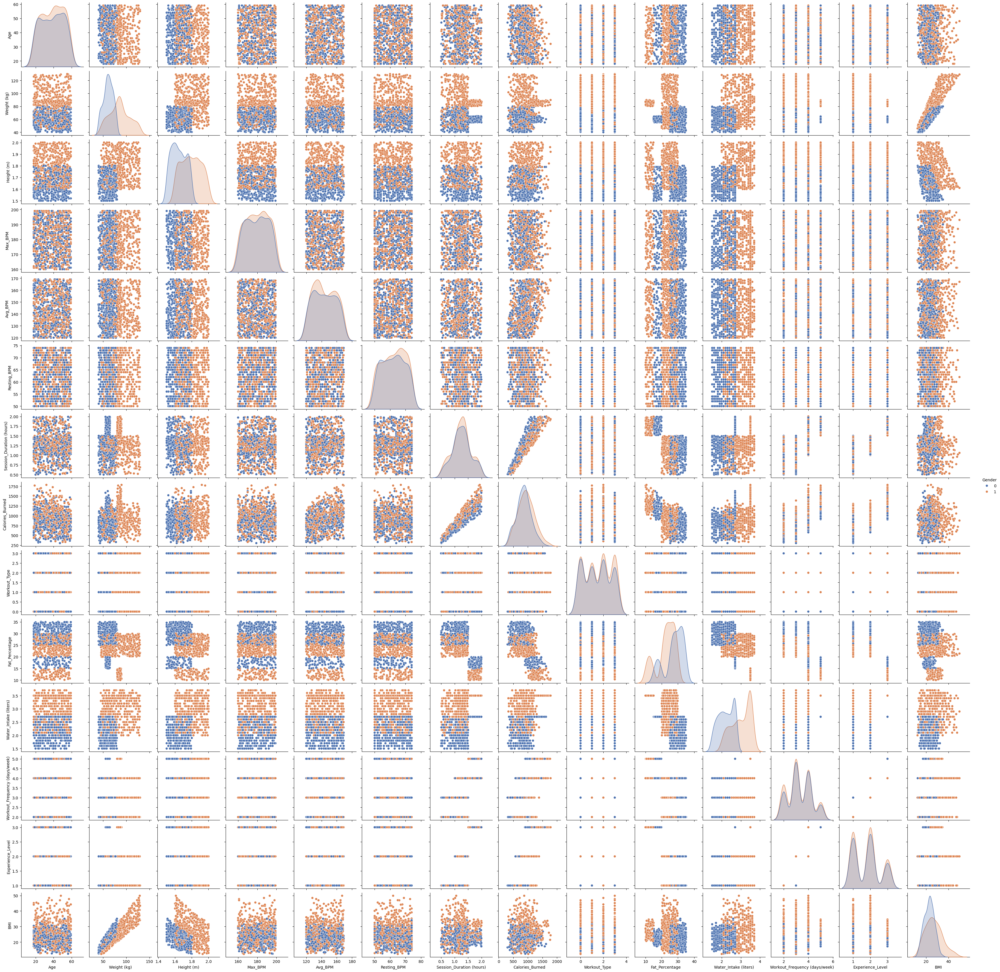

In [ ]:
from IPython.display import Image
import seaborn as sns
import matplotlib.pyplot as plt 

# Encode categorical variables
encoded_df = df.copy()
encoded_df['Gender'] = encoded_df['Gender'].astype('category').cat.codes
encoded_df['Workout_Type'] = encoded_df['Workout_Type'].astype('category').cat.codes

# Plot pairplot
if not os.path.exists("pairplot.png"):
    sns_plot = sns.pairplot(encoded_df, hue='Gender', palette='deep')
    sns_plot.savefig("pairplot.png")
    plt.clf() 

Image(filename='pairplot.png')

### Findings

`Weight (kg)` and `BMI` are highly correlated, which is expected.

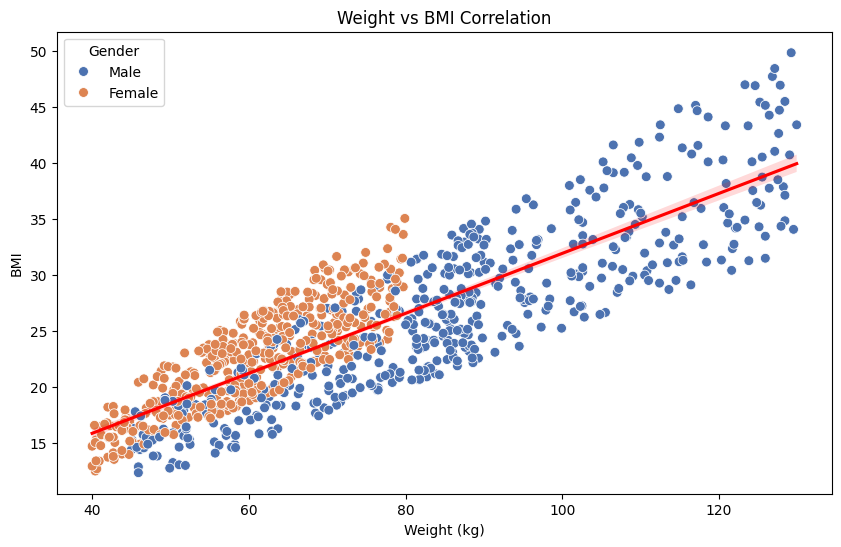

Correlation between Weight and BMI: 0.8531576898507092


In [5]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Weight (kg)", y="BMI", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Weight (kg)", y="BMI", scatter=False, line_kws={"color":"red"})
plt.title("Weight vs BMI Correlation")
plt.xlabel("Weight (kg)")
plt.ylabel("BMI")
plt.show()

correlation = df["Weight (kg)"].corr(df["BMI"])
print(f"Correlation between Weight and BMI: {correlation}")

`Session_Duration (hours)` and `Calories_Burned` are highly correlated, which is expected.

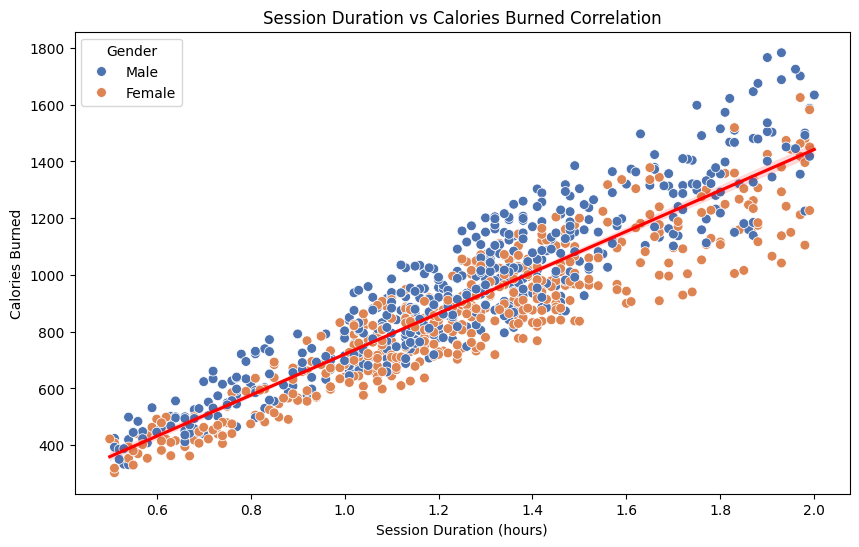

Correlation between Session Duration and Calories Burned: 0.9081403755270124


In [6]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Session_Duration (hours)", y="Calories_Burned", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Session_Duration (hours)", y="Calories_Burned", scatter=False, line_kws={"color":"red"})
plt.title("Session Duration vs Calories Burned Correlation")
plt.xlabel("Session Duration (hours)")
plt.ylabel("Calories Burned")
plt.show()

correlation = df["Session_Duration (hours)"].corr(df["Calories_Burned"])
print(f"Correlation between Session Duration and Calories Burned: {correlation}")

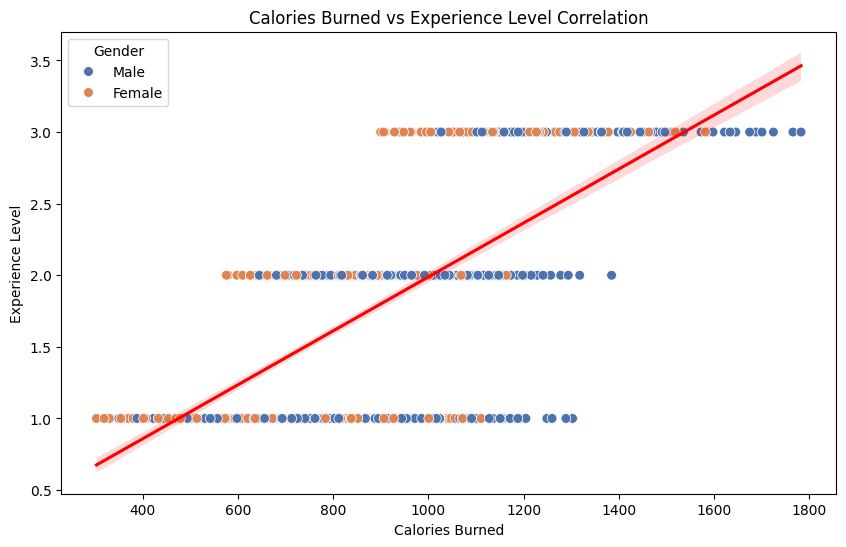

Correlation between Calories Burned and Experience Level: 0.6941294479312866


In [7]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Calories_Burned", y="Experience_Level", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Calories_Burned", y="Experience_Level", scatter=False, line_kws={"color":"red"})
plt.title("Calories Burned vs Experience Level Correlation")
plt.xlabel("Calories Burned")
plt.ylabel("Experience Level")
plt.show()

correlation = df["Calories_Burned"].corr(df["Experience_Level"])
print(f"Correlation between Calories Burned and Experience Level: {correlation}")

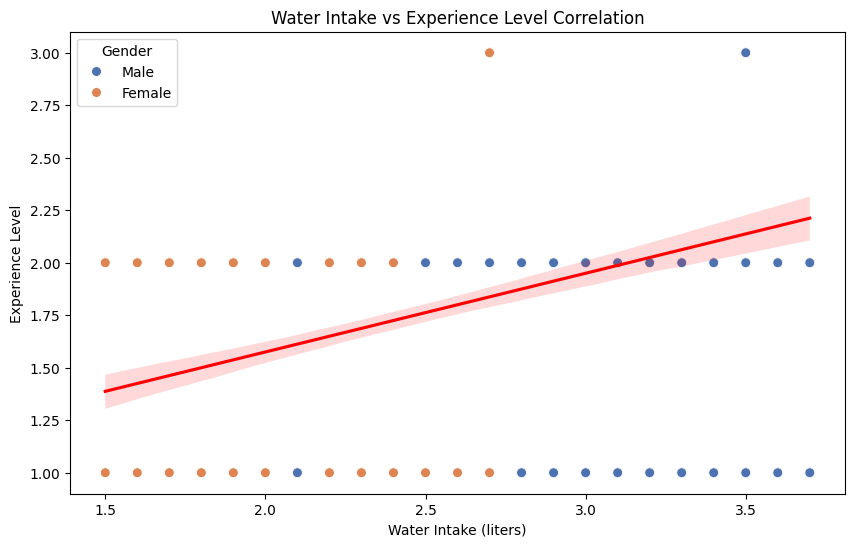

Correlation between Water Intake and Experience Level: 0.3041035493702366


In [9]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Water_Intake (liters)", y="Experience_Level", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Water_Intake (liters)", y="Experience_Level", scatter=False, line_kws={"color":"red"})
plt.title("Water Intake vs Experience Level Correlation")
plt.xlabel("Water Intake (liters)")
plt.ylabel("Experience Level")
plt.show()

correlation = df["Water_Intake (liters)"].corr(df["Experience_Level"])
print(f"Correlation between Water Intake and Experience Level: {correlation}")

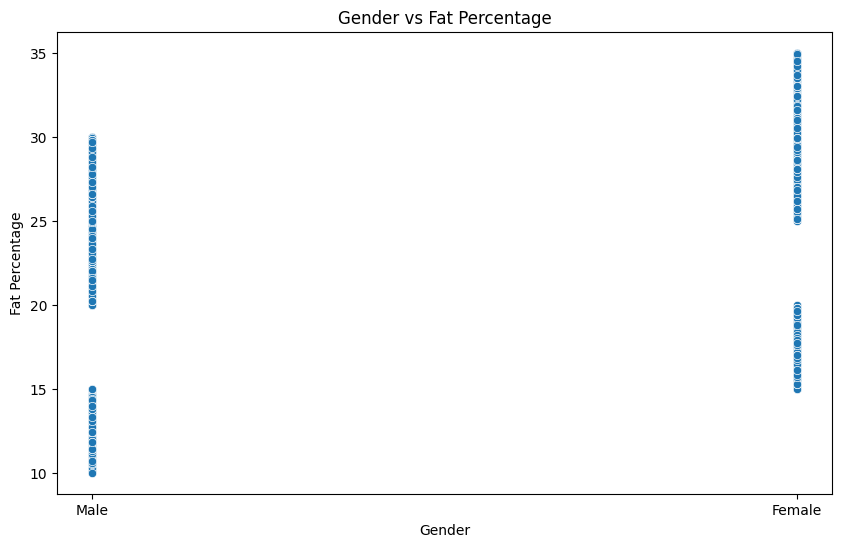

Average Fat Percentage by Gender:
Gender
Female    27.656710
Male      22.553816
Name: Fat_Percentage, dtype: float64


In [63]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Gender", y="Fat_Percentage")
plt.title("Gender vs Fat Percentage")
plt.xlabel("Gender")
plt.ylabel("Fat Percentage")
plt.show()

correlation = df.groupby("Gender")["Fat_Percentage"].mean()
print(f"Average Fat Percentage by Gender:\n{correlation}")

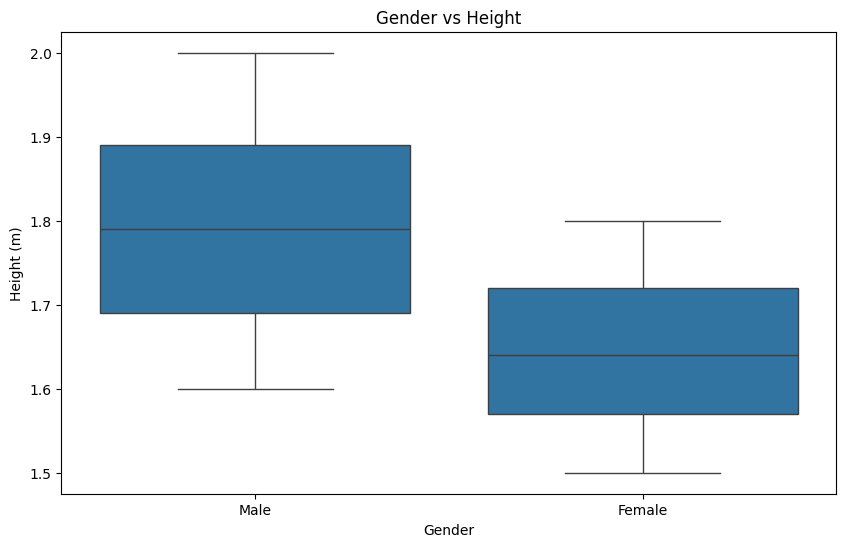

Average Height by Gender:
Gender
Female    1.644242
Male      1.793405
Name: Height (m), dtype: float64


In [68]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Gender", y="Height (m)")
plt.title("Gender vs Height")
plt.xlabel("Gender")
plt.ylabel("Height (m)")
plt.show()

average_height = df.groupby("Gender")["Height (m)"].mean()
print(f"Average Height by Gender:\n{average_height}")

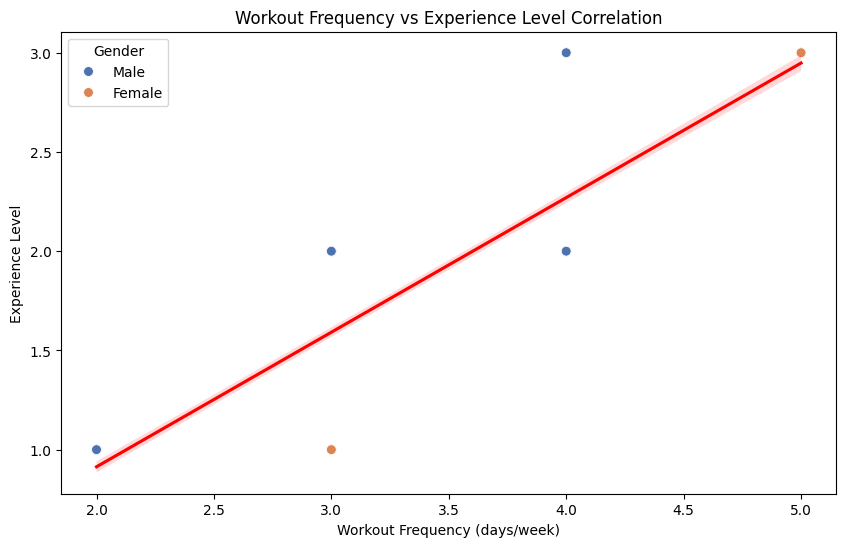

Correlation between Workout Frequency and Experience Level: 0.8370787093906671


In [14]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Workout_Frequency (days/week)", y="Experience_Level", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Workout_Frequency (days/week)", y="Experience_Level", scatter=False, line_kws={"color":"red"})
plt.title("Workout Frequency vs Experience Level Correlation")
plt.xlabel("Workout Frequency (days/week)")
plt.ylabel("Experience Level")
plt.show()

correlation = df["Workout_Frequency (days/week)"].corr(df["Experience_Level"])
print(f"Correlation between Workout Frequency and Experience Level: {correlation}")

## Bivariate analysis

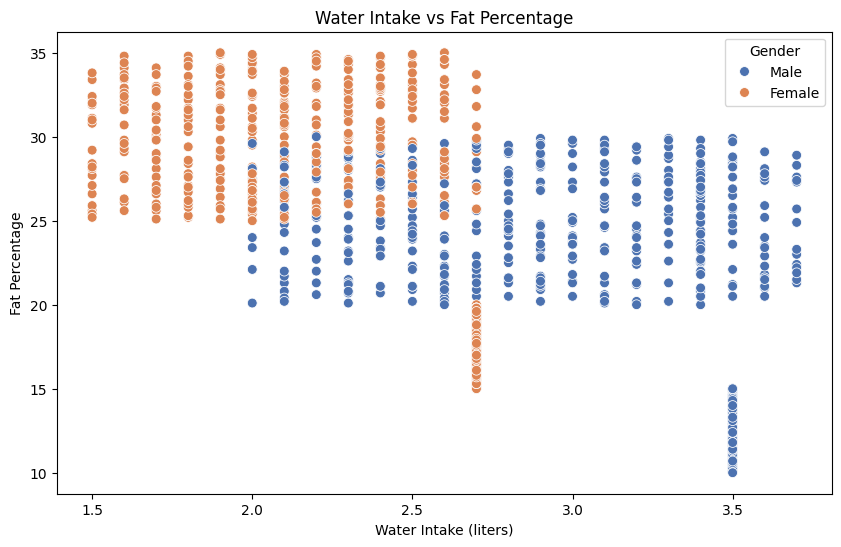

In [41]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Water_Intake (liters)", y="Fat_Percentage", hue="Gender", palette="deep", s=50)
plt.title("Water Intake vs Fat Percentage")
plt.xlabel("Water Intake (liters)")
plt.ylabel("Fat Percentage")
plt.show()

There data is highly influenced by the `Gender` feature

In [173]:
from scipy import stats

# T-test between male and female target values
male_target = df[df['Gender'] == 'Male']['Calories_Burned']
female_target = df[df['Gender'] == 'Female']['Calories_Burned']
t_stat, p_value = stats.ttest_ind(male_target, female_target)
print(f"T-Statistic: {t_stat}, P-Value: {p_value}")

T-Statistic: 4.748466491662088, P-Value: 2.3581175428096e-06


In [174]:
from scipy import stats

# Assuming you have two groups (Male and Female) in a column 'Gender' and your target variable in 'Target'
male_data = df[df['Gender'] == 'Male']['Calories_Burned']
female_data = df[df['Gender'] == 'Female']['Calories_Burned']

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(male_data, female_data)

# Output the results
print("F-Statistic:", f_statistic)
print("P-Value:", p_value)


F-Statistic: 22.54793402243767
P-Value: 2.358117542810329e-06


In [178]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Fit the model using OLS (Ordinary Least Squares)
model = ols('Calories_Burned ~ C(Gender)', data=df).fit()

# Perform ANOVA
anova_table = sm.stats.anova_lm(model, typ=2)

# Output the results
print(anova_table)


                 sum_sq     df          F    PR(>F)
C(Gender)  1.639714e+06    1.0  22.547934  0.000002
Residual   7.061235e+07  971.0        NaN       NaN


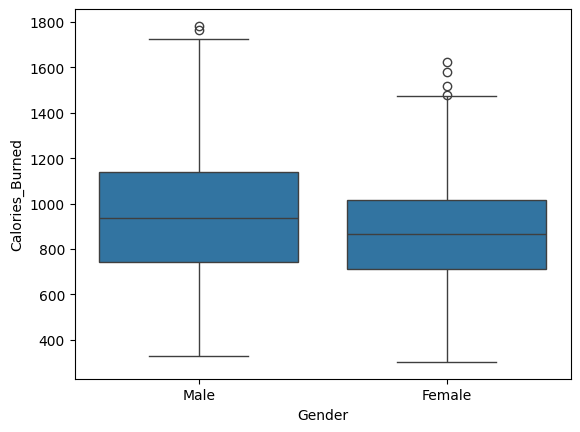

In [180]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a boxplot
sns.boxplot(x='Gender', y='Calories_Burned', data=df)

# Show the plot
plt.show()


In [182]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(interaction_only=True)
data_interactions = poly.fit_transform(df[['Gender', 'Calories_Burned']])


ValueError: could not convert string to float: 'Male'

## Multivariate analysis

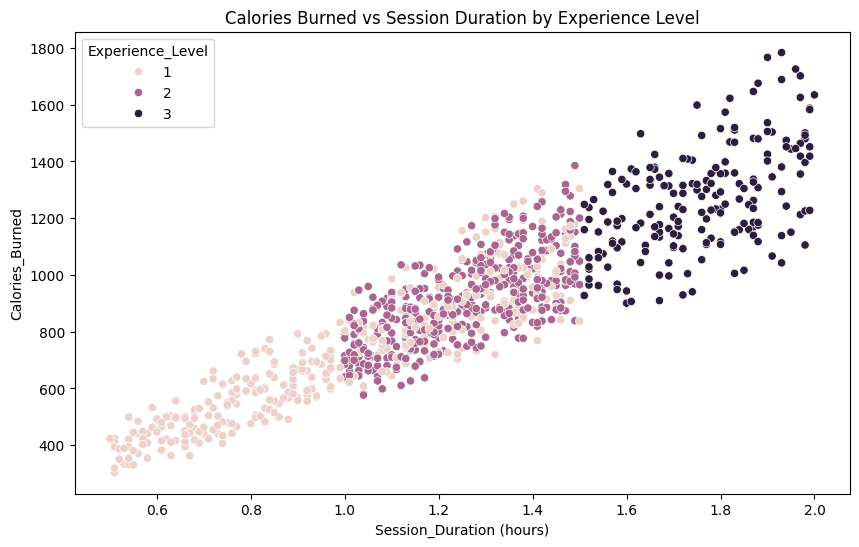

In [66]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Session_Duration (hours)', y='Calories_Burned', hue='Experience_Level', data=df)
plt.title('Calories Burned vs Session Duration by Experience Level')
plt.show()

## Initial findings